In [1]:
import json
import sys
import wget

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.ticker import MaxNLocator, FuncFormatter
import plotly.graph_objects as go
from scipy.interpolate import interp1d
from astropy.table import Table
from astropy.io import fits

from astropy.wcs import WCS
import astropy.units as u
import astropy.time
import astropy.coordinates

from dust_extinction.parameter_averages import G23

In [ ]:
sys.executable

'/net/ASTRO/brunoritter/miniconda3/envs/qperedux/bin/python'

In [2]:
# path = "/gmos/gs-2022b-q-202/"
path = ""

In [12]:
flat_lamp_dic = {}
for band in sci_files_mapping.values():
    for sci in band.values():
        flat_lamp_dic[sci["flat"]] = sci["arc"]

flat_lamp_dic

with open("flat_lamp_mapping.json", "w") as f:
    json.dump(flat_lamp_dic, f)

In [105]:
def find_single_lambda_range(t_image):
    with fits.open(t_image) as hdulist:
        header = hdulist[2].header

    npix = header["NAXIS1"]
    first_lambda = header["CRVAL1"]
    dw = header["CD1_1"]
    last_lambda = first_lambda + npix * dw

    return first_lambda, last_lambda


def map_lambda_ranges(sci_files_mapping):
    lambda_ranges = {}
    flat_mapping = {
        k: v for subdict in sci_files_mapping.values() for k, v in subdict.items()
    }
    objects = set([file["object"] for file in flat_mapping.values()])
    for target in objects:
        min_lambda = 1e10
        max_lambda = 0
        for file_name, metadata in flat_mapping.items():
            if metadata["object"] == target:
                candidate_min_lambda, candidate_max_lambda = find_single_lambda_range(
                    f"txeqxbrg{file_name}"
                )
                min_lambda = min(min_lambda, candidate_min_lambda)
                max_lambda = max(max_lambda, candidate_max_lambda)
        lambda_ranges[target] = {}
        lambda_ranges[target]["min"] = min_lambda
        lambda_ranges[target]["max"] = max_lambda
    return lambda_ranges


def find_ref_dw(lambda_ref):
    flat_mapping = {
        k: v for subdict in sci_files_mapping.values() for k, v in subdict.items()
    }
    for target in lambda_ref.keys():
        candidates = [
            image for image, value in flat_mapping.items() if value["object"] == target
        ]
        ref_image = candidates[0]
        with fits.open(f"txeqxbrg{ref_image}") as hdulist:
            dw = hdulist[2].header["CD1_1"]

        lambda_ref[target]["dw"] = dw
    return lambda_ref


find_ref_dw(map_lambda_ranges(sci_files_mapping))

{'eRO-QPE2': {'min': 4171.203, 'max': 7650.506236, 'dw': 1.015},
 'GSN 069': {'min': 4171.203, 'max': 7650.506236, 'dw': 1.015}}

#### Correct bias on cubes

In [134]:
with open("../sci_files_mapping.json", "r") as f:
    sci_files_mapping = json.load(f)

sci_files_mapping

{'0.575': {'S20220929S0044.fits': {'flat': 'S20220929S0046.fits',
   'arc': 'S20220929S0099.fits',
   'star': 'S20220918S0059.fits',
   'object': 'GSN 069'},
  'S20220929S0045.fits': {'flat': 'S20220929S0046.fits',
   'arc': 'S20220929S0099.fits',
   'star': 'S20220918S0059.fits',
   'object': 'GSN 069'},
  'S20220929S0049.fits': {'flat': 'S20220929S0050.fits',
   'arc': 'S20220929S0099.fits',
   'star': 'S20220918S0059.fits',
   'object': 'GSN 069'},
  'S20220929S0057.fits': {'flat': 'S20220929S0059.fits',
   'arc': 'S20220929S0099.fits',
   'star': 'S20220918S0059.fits',
   'object': 'eRO-QPE2'},
  'S20220929S0058.fits': {'flat': 'S20220929S0059.fits',
   'arc': 'S20220929S0099.fits',
   'star': 'S20220918S0059.fits',
   'object': 'eRO-QPE2'},
  'S20220929S0062.fits': {'flat': 'S20220929S0063.fits',
   'arc': 'S20220929S0099.fits',
   'star': 'S20220918S0059.fits',
   'object': 'eRO-QPE2'}},
 '0.605': {'S20220929S0048.fits': {'flat': 'S20220929S0047.fits',
   'arc': 'S20220929S0100.f

In [ ]:
def slice_image_data(image_data, rows_sample_size):
    # Divide a imagem em fatias e calcula a média para cada fatia
    num_slices = image_data.shape[0] // rows_sample_size
    slices = np.array_split(image_data, num_slices)
    averaged_slices = [np.mean(slice, axis=0) for slice in slices]

    def remove_outliers(data, factor=10):
        Q1 = np.percentile(data, 25)
        Q3 = np.percentile(data, 75)
        IQR = Q3 - Q1

        lower_bound = Q1 - factor * IQR
        upper_bound = Q3 + factor * IQR

        # Usando a mediana para substituir outliers
        median = np.median(data)
        data_cleaned = np.where(
            (data < lower_bound) | (data > upper_bound), median, data
        )

        return data_cleaned

    # Aplicar a função de remoção de outliers a cada averaged_slice
    averaged_slices_clean = [remove_outliers(slice) for slice in averaged_slices]

    def trim_zeros_from_slice(data):
        non_zero_indices = np.where(data != 0)[0]
        if non_zero_indices.size == 0:
            return data  # Se todos os valores forem zero, retorne o array original
        start, end = non_zero_indices[0], non_zero_indices[-1] + 1
        return data[start:end]

    # Remover zeros das extremidades de cada averaged_slice_clean
    trimmed_slices = [trim_zeros_from_slice(slice) for slice in averaged_slices_clean]

    return trimmed_slices

In [ ]:
file = "xbrgS20220929S0064.fits"

with fits.open(file) as hdulist:
    image_data = hdulist["SCI"].data

processed_slices = slice_image_data(image_data, 15)
num_slices = len(processed_slices)

# Layout config
cols = 3
rows = np.ceil(num_slices / cols).astype(int)

fig, axes = plt.subplots(rows, cols, figsize=(15, 3 * rows))

for i, data in enumerate(processed_slices):
    row = i // cols
    col = i % cols
    ax = axes[row, col] if rows > 1 else axes[col]

    # Fit line
    x = np.arange(data.size)
    coef = np.polyfit(x, data, 1)
    fit_fn = np.poly1d(coef)

    # Plot
    ax.plot(data, "b-", label="Data")
    ax.plot(fit_fn(x), "r-", label=f"Line: y = {coef[0]:.8f}x + {coef[1]:.5f}")
    ax.set_title(f"Slice {i + 1}")
    ax.grid(True)
    ax.legend()
    ax.set_ylim(-25, 100)
plt.tight_layout()
plt.show()

#### Investigate differences in atmospheric conditions during each observation

In [2]:
import json

# Create sci_files_maping
with open("sci_files_mapping.json", "r") as f:
    sci_files_mapping = json.load(f)

files = {}
for cw in sci_files_mapping.values():
    for sci, meta in cw.items():
        files[sci] = meta["object"]

objects = set([object for object in files.values()])

sci_files_object_mapping = {}
for object in objects:
    sci_files_object_mapping[object] = []
    for file, object_name in files.items():
        if object_name == object:
            sci_files_object_mapping[object].append(file)

sci_files_object_mapping

with open("sci_files_object_mapping.json", "w") as f:
    json.dump(sci_files_object_mapping, f)

In [35]:
# Gather data from headers to check the variance in atmospheric conditions.
# This is done to decide what paramaters to input for the atmopheric dispersion correction in
atmvars = ["TAMBIENT", "PRESSUR2", "HUMIDITY", "AIRMASS"]
atm_conditions = {atmvar: [] for atmvar in atmvars}
atm_conditions["object_name"] = []

for object_name, observations in sci_files_object_mapping.items():
    for observation in observations:
        with fits.open(f"redux/cstxeqxbrg{observation}") as hdulist:
            primary = hdulist["PRIMARY"]

        for atmvar in atmvars:
            atm_conditions[atmvar].append(primary.header[atmvar])
    obj_name_list = [object_name] * len(observations)
    atm_conditions["object_name"].extend(obj_name_list)

atm_df = pd.DataFrame(atm_conditions)
atm_df.head()

,TAMBIENT,PRESSUR2,HUMIDITY,AIRMASS,object_name
0,4.86,72624.7344,43.8,1.068915,eRO-QPE2
1,4.96,72607.8024,44.1,1.054507,eRO-QPE2
2,4.64,72587.4840,42.4,1.033990,eRO-QPE2
3,4.39,72601.0296,42.1,1.040571,eRO-QPE2
4,4.47,72563.7792,41.3,1.030362,eRO-QPE2


In [19]:
# Create visualization for the atmospheric conditions
fig = go.Figure()

for object_name in atm_df["object_name"].unique():
    subset = atm_df[atm_df["object_name"] == object_name]
    fig.add_trace(
        go.Scatter3d(
            x=subset["TAMBIENT"],
            y=subset["PRESSUR2"],
            z=subset["HUMIDITY"],
            mode="markers",
            name=object_name,
        )
    )

# Set the axis titles
fig.update_layout(
    scene=dict(
        xaxis_title="Temperature (C)",
        yaxis_title="Pressure (mB = 100 Pa)",
        zaxis_title="Humidity (fraction, 0..101)",
    ),
    title="Atmospheric conditions during observations",
)

# Show the plot
fig.show()

In [9]:
# Descriptive statistics for atmospheric data
atm_df_summary = atm_df.groupby("object_name").describe()

pd.set_option("display.max_columns", None)
print(atm_df_summary)

            TAMBIENT                                                         
               count      mean       std   min     25%   50%     75%   max   
object_name                                                                  
GSN 069          6.0  5.098333  0.212924  4.73  5.0225  5.16  5.2225  5.32  \
eRO-QPE2         6.0  4.650000  0.221450  4.39  4.4975  4.61  4.8050  4.96   

            PRESSUR2                                                  
               count        mean        std         min         25%   
object_name                                                           
GSN 069          6.0  72682.8676  16.920708  72658.5984  72673.8372  \
eRO-QPE2         6.0  72591.4348  24.552373  72563.7792  72569.7054   

                                                HUMIDITY                   
                    50%         75%         max    count  mean       std   
object_name                                                                
GSN 069      72682.3032  

#### Combine spectra of all observations

In [26]:
# Load all science and data quality data on a convenient structure [object][obervation][sci] and [object][obervation][dq], etc
with open("sci_files_object_mapping.json", "r") as f:
    sci_files_object_mapping = json.load(f)

raw_data = {}
for object, files in sci_files_object_mapping.items():
    raw_data[object] = {}
    for file in files:
        raw_data[object][file] = {}
        filename = f"redux/cstxeqxbrg{file}"
        hdulist = fits.open(filename)
        raw_data[object][file]["sci"] = hdulist["SCI"].data

        # make a mask for artificial pixels, with no real data
        raw_data[object][file]["artificial_pixels"] = hdulist["SCI"].data == 0

        # mark artificial pixels as dead on DQ and DQ mask
        raw_data[object][file]["dq"] = np.where(
            raw_data[object][file]["artificial_pixels"] == True, 31, hdulist["DQ"].data
        )

        raw_data[object][file]["mask"] = raw_data[object][file]["dq"] == 0
        raw_data[object][file]["var"] = hdulist["VAR"].data
        hdulist.close()

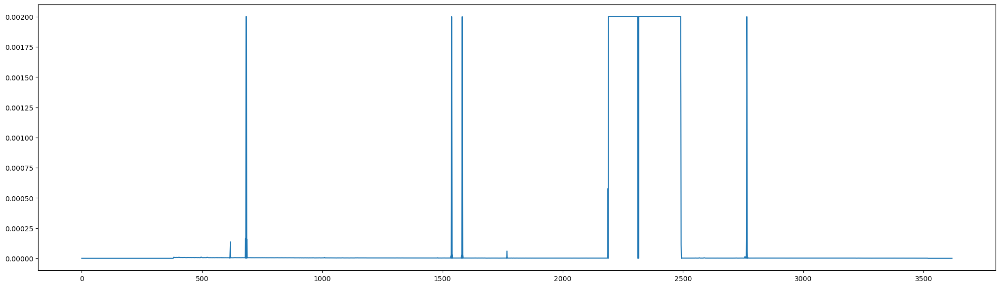

In [176]:
files = list(raw_data["GSN 069"].keys())
idx = 3
plt.figure(figsize=(25, 7))
plt.plot(np.clip(raw_data["GSN 069"][files[idx]]["var"][250], 0, 0.002))

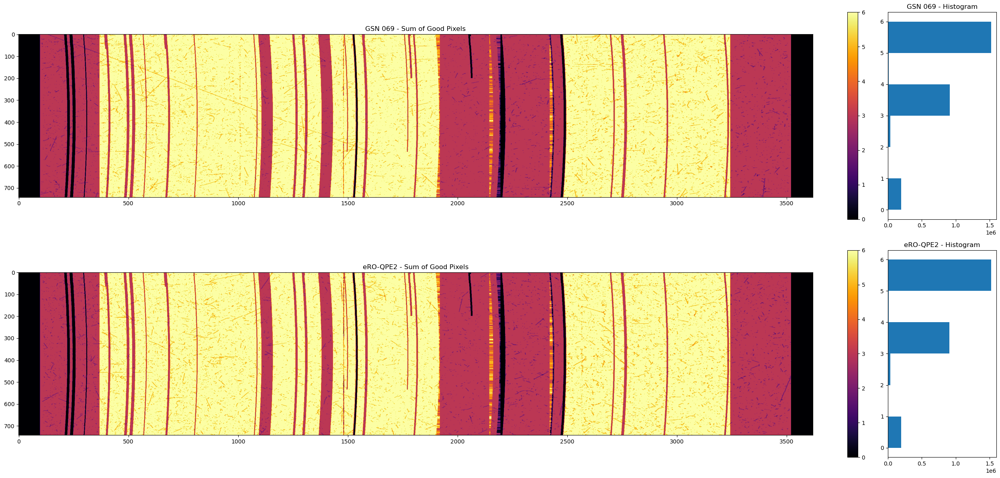

In [4]:
# Data quality assessment. Sums and visualize all data quality masks.
combined_dq = {}
num_objects = len(raw_data.keys())

# Create a GridSpec layout with 2 rows and num_objects*2 columns
fig = plt.figure(figsize=(25, 6 * num_objects))
gs = gridspec.GridSpec(
    num_objects, 2, width_ratios=[8, 1]
)  # 5:1 width ratio between 2D plot and histogram

for idx, object in enumerate(raw_data.keys()):
    combined_dq[object] = [file["mask"] for file in raw_data[object].values()]
    combined_dq[object] = np.sum(combined_dq[object], axis=0)

    # Display the sum of good pixels using most of the row
    ax_imshow = plt.subplot(gs[idx, 0])
    im = ax_imshow.imshow(combined_dq[object], cmap="inferno")
    ax_imshow.set_title(f"{object} - Sum of Good Pixels")
    fig.colorbar(im, ax=ax_imshow, fraction=0.046, pad=0.04)  # Added colorbar here

    # Histogram of good pixels on the right side
    ax_hist = plt.subplot(gs[idx, 1])
    ax_hist.hist(combined_dq[object].ravel(), bins=6, orientation="horizontal")
    ax_hist.set_title(f"{object} - Histogram")

plt.tight_layout()
plt.show()

In [25]:
# Combines sci and var data. Multiply each sci and var observation by its quality mask, then averages all masked observations for each object
combined_spectra = {}
for object, data in raw_data.items():
    combined_spectra[object] = {}

    # Set bad pixels to np.nan
    nan_masked_data = [
        np.where(observation["mask"] == False, np.nan, observation["sci"])
        for observation in data.values()
    ]
    nan_masked_var = [
        np.where(observation["mask"] == False, np.nan, observation["var"])
        for observation in data.values()
    ]

    # Compute the sum, mean, and standard deviation using np.nan-aware functions
    combined_spectra[object]["sum"] = np.nansum(nan_masked_data, axis=0)
    combined_spectra[object]["mean"] = np.nanmean(nan_masked_data, axis=0)
    combined_spectra[object]["std"] = np.nanstd(nan_masked_data, axis=0)
    combined_spectra[object]["sample_size"] = np.sum(
        [data["mask"] for data in data.values()], axis=0
    )
    combined_spectra[object]["DQ"] = raw_data[object][list(data.keys())[0]]["dq"]
    combined_spectra[object]["VAR"] = np.nanmean(nan_masked_var, axis=0)

combined_spectra.keys()

NameError: name 'raw_data' is not defined

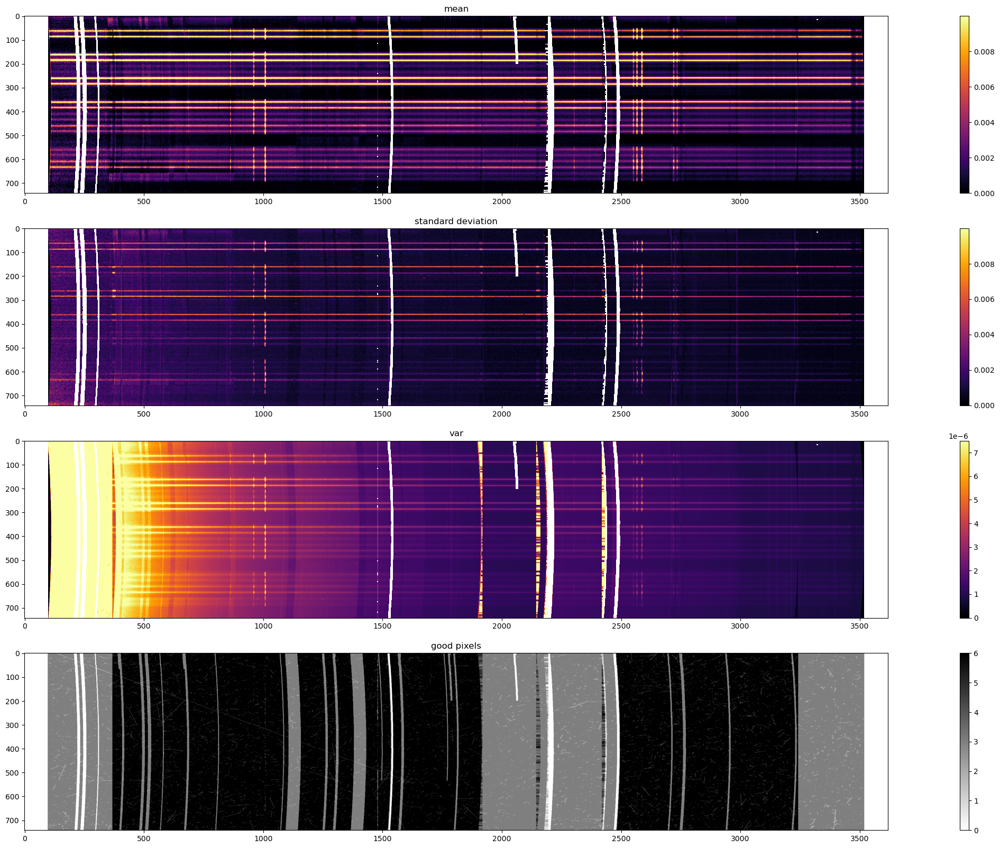

In [7]:
# Visual inspection of the combination of sci data and data quality mask
object = "GSN 069"

# Define thresholds
max_val_mean = 0.01
min_val_mean = 0

max_val_sum = 0.06
min_val_sum = 0

max_val_std = 0.01
min_val_std = 0

min_val_var = 0
max_val_var = 0.0000075

fig, axs = plt.subplots(4, 1, figsize=(35, 20))

im_mean = axs[0].imshow(
    np.clip(combined_spectra[object]["mean"], min_val_mean, max_val_mean),
    cmap="inferno",
)
fig.colorbar(im_mean, ax=axs[0])
axs[0].set_title("mean")

im_std = axs[1].imshow(
    np.clip(combined_spectra[object]["std"], min_val_std, max_val_std), cmap="inferno"
)
fig.colorbar(im_std, ax=axs[1])
axs[1].set_title("standard deviation")

im_var = axs[2].imshow(
    np.clip(combined_spectra[object]["VAR"], min_val_var, max_val_var), cmap="inferno"
)
fig.colorbar(im_var, ax=axs[2])
axs[2].set_title("var")

im_sample = axs[3].imshow(combined_spectra[object]["sample_size"], cmap="binary")
fig.colorbar(im_sample, ax=axs[3])
axs[3].set_title("good pixels")

plt.show()

In [6]:
filename = f"redux/cstxeqxbrg{sci_files_object_mapping[object_name][0]}"
with fits.open(filename) as og_hdu:
    print(np.unique(og_hdu["DQ"].data))
    dq = og_hdu["DQ"]

[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  20  21  22  23  24  25  26  27  28  29  30  31 256 257 258 259 260
 261 262 263 264 266 267 269 271 272 280 282 285 287]


In [29]:
values = [
    0,
    1,
    2,
    3,
    4,
    5,
    6,
    7,
    8,
    9,
    10,
    11,
    12,
    13,
    14,
    15,
    16,
    17,
    18,
    19,
    20,
    22,
    23,
    24,
    25,
    26,
    27,
    28,
    29,
    30,
    31,
    256,
    257,
    258,
    259,
    260,
    261,
    262,
    263,
    264,
    265,
    266,
    267,
    269,
    270,
    271,
    272,
    277,
    279,
    280,
    282,
    285,
]

bit_flags = {value: bin(value) for value in values if bin(value).count("1") == 5}


bit_flags

{31: '0b11111', 271: '0b100001111', 279: '0b100010111', 285: '0b100011101'}

In [143]:
# Create a new FITS file for the cleaned spectra
atmvars = ["TAMBIENT", "PRESSUR2", "HUMIDITY", "AIRMASS"]
atm_conditions = {atmvar: [] for atmvar in atmvars}
atm_conditions["object_name"] = []

for object_name, observations in sci_files_object_mapping.items():
    for observation in observations:
        with fits.open(f"redux/cstxeqxbrg{observation}") as hdulist:
            primary = hdulist["PRIMARY"]

        for atmvar in atmvars:
            atm_conditions[atmvar].append(primary.header[atmvar])
    obj_name_list = [object_name] * len(observations)
    atm_conditions["object_name"].extend(obj_name_list)

atm_df = pd.DataFrame(atm_conditions)

fits_dic = {}
for object_name in combined_spectra.keys():
    fits_dic[object_name] = {}
    fits_dic[object_name]["SCI"] = combined_spectra[object_name]["mean"]
    fits_dic[object_name]["VAR"] = combined_spectra[object_name]["VAR"]
    fits_dic[object_name]["DQ"] = np.where(
        combined_spectra[object]["sample_size"] >= 3, 0, 31
    ).astype("uint16")


for object_name, data in fits_dic.items():
    filename = f"redux/cstxeqxbrg{sci_files_object_mapping[object_name][0]}"
    with fits.open(filename) as og_hdu:
        # Input the mean of each relevant atmospheric variable in the FITS header
        for atmvar in atmvars:
            og_hdu["PRIMARY"].header[atmvar] = np.mean(
                atm_df[atm_df["object_name"] == object_name][atmvar]
            )

        for key, value in data.items():
            hdu = fits.ImageHDU(data=value, name=key, header=og_hdu[key].header)
            og_hdu[key] = hdu

        # og_hdu["SCI"].header["EXTVER"] = 1
        name = object_name.replace(" ", "").lower()
        filename = f"redux/{name}_combined_spectra.fits"
        og_hdu.writeto(filename, overwrite=True)
        print(f"combined data saved at: {filename}")

combined data saved at: redux/ero-qpe2_combined_spectra.fits
combined data saved at: redux/gsn069_combined_spectra.fits


#### Galactic extinction correction

In [136]:
with open("sci_files_object_mapping.json", "r") as f:
    sci_files_object_mapping = json.load(f)

In [137]:
object_name = "GSN 069"
filename = f"redux/cstxeqxbrg{sci_files_object_mapping[object_name][0]}"


def get_galactic_coord(filename):
    with fits.open(filename) as hdul:
        header = hdul[0].header

    coord = astropy.coordinates.TETE(
        ra=header["RA"] * u.deg,
        dec=header["DEC"] * u.deg,
        obstime=astropy.time.Time(header["DATE-OBS"]),
    )

    coord = coord.transform_to(astropy.coordinates.Galactic())
    return coord.l.deg, coord.b.deg


get_galactic_coord(filename)

(266.0380720718457, -80.81866036697947)

In [147]:
name = object_name.replace(" ", "").lower()
filename = f"redux/{name}_combined_spectra.fits"
with fits.open(filename) as hdul:
    input_data = hdul["SCI"].data

fits_header = fits.getheader(filename, ext=("sci", 1))
wcs = WCS(fits_header, naxis=[1])
wavelength = wcs.wcs_pix2world(np.arange(fits_header["NAXIS1"]), 0)[0] * u.AA

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


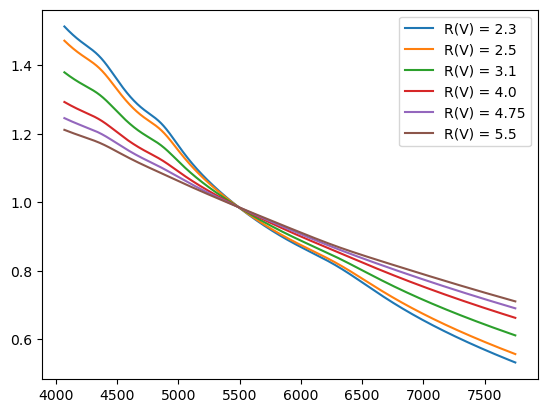

In [139]:
fig, ax = plt.subplots()
Rvs = [2.3, 2.5, 3.1, 4.0, 4.75, 5.5]
for Rv in Rvs:
    ext_model = G23(Rv=Rv)
    ax.plot(wavelength, ext_model(wavelength), label="R(V) = " + str(Rv))

ax.legend(loc="best")
plt.show()

In [148]:
u_flux = u.erg / (u.cm**2 * u.s * u.AA)

Rv = 3.08
Ebv = 0.024
ext_model = G23(Rv)
correction_factor = ext_model.extinguish(wavelength, Ebv=Ebv)
# input_data = fits_dic['GSN 069']['SCI']
unestinguished_spectra = np.zeros(input_data.shape)
for index, spectrum in enumerate(input_data):
    flux = spectrum * u_flux
    unestinguished_spectra[index] = flux / correction_factor

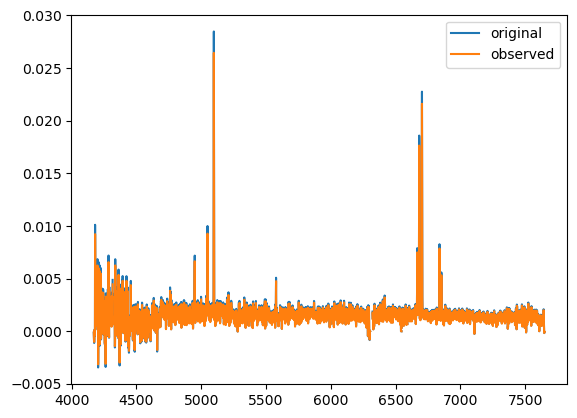

In [149]:
fiber = 600
plt.plot(wavelength, unestinguished_spectra[fiber], label="original")
plt.plot(wavelength, input_data[fiber], label="observed")
plt.legend()

In [151]:
name = "gsn069"
filename = f"redux/{name}_combined_spectra.fits"
new_filename = f"redux/{name}_combined_spectra_ext.fits"
with fits.open(filename) as hdul:
    hdul["SCI"].data = unestinguished_spectra
    hdul.writeto(new_filename, overwrite=True)

#### PCA tomography on combined spectra

In [154]:
name = "gsn069"
filename = f"redux/{name}_combined_spectra_ext.fits"
redshift = 0.018
emission_line_window_size = 8
pca_selection_criteria = "selection_index"

emission_lines = [
    4101.73,  # Hδ
    4340.46,  # Hγ
    4363.21,  # [O III]
    4471.5,  # He I
    4685.68,  # He II
    4861.33,  # Hβ
    4958.91,  # [O III]
    5006.84,  # [O III]
    5875.6,  # He I
    6300.30,  # [O I]
    6363.78,  # [O I]
    6548.05,  # [N II]
    6562.79,  # Hα
    6583.45,  # [N II]
    6716.44,  # [S II]
    6730.82,  # [S II]
    7135.8,  # [Ar III]
]

observed_absortion_windows = [
    (4124, 4150),
    (4282, 4317),
    (4370, 4421),
    (4515, 4592),
    (5028, 5050),
    (5070, 5135),
    (5161, 5193),
    (5247, 5287),
    (5314, 5354),
    (5390, 5417),
    (5698, 5722),
    (5938, 5995),
    (6050, 6073),
]

In [155]:
from pca_cleaning import SpectralPCA

data = SpectralPCA(
    filename,
    redshift,
    emission_lines,
    emission_line_window_size,
    observed_absortion_windows,
)
data.pca_decompose()
data.luminosity_component_correlation(pca_selection_criteria)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


x2     25421.719746
x3       323.623573
x1       231.483767
x4        17.010902
x6         2.852052
x14        1.718393
x9         0.309276
x10        0.283833
x12        0.264769
x13        0.178567
x7         0.124221
x16        0.116824
x8         0.101484
x5         0.095354
x19        0.041402
x18        0.034245
x17        0.031149
x11        0.022731
x15        0.014494
x20        0.002835
Name: selection_index, dtype: float64


In [157]:
selection_threshold = 0.08
data.subtract_bad_components(selection_threshold)

Removing components: [18, 17, 16, 10, 14, 19]


In [163]:
stepfilter3 = data.StepSignalRemoval(3)
stepfilter3.calculate_and_subtract_step_signal(1726.965142774873, 3.25)
step_signal3 = stepfilter3.bad_signal

stepfilter2 = data.StepSignalRemoval(2)
stepfilter2.calculate_and_subtract_step_signal(1716.404884951783, 1.5)
step_signal2 = stepfilter2.bad_signal

stepfilter4 = data.StepSignalRemoval(4)
stepfilter4.calculate_and_subtract_step_signal(1703.75, 0)
step_signal4 = stepfilter4.bad_signal

stepfilter5 = data.StepSignalRemoval(5)
stepfilter5.calculate_and_subtract_step_signal(1703.75, 0)
step_signal5 = stepfilter5.bad_signal

stepfilter8 = data.StepSignalRemoval(8)
stepfilter8.calculate_and_subtract_step_signal(1694.375, 0)
step_signal8 = stepfilter8.bad_signal

step_total = step_signal2 + step_signal3 + step_signal4 + step_signal5 + step_signal8
step_free_source = data.noise_subtracted_source - step_total

#### Paramater space for filters exploration

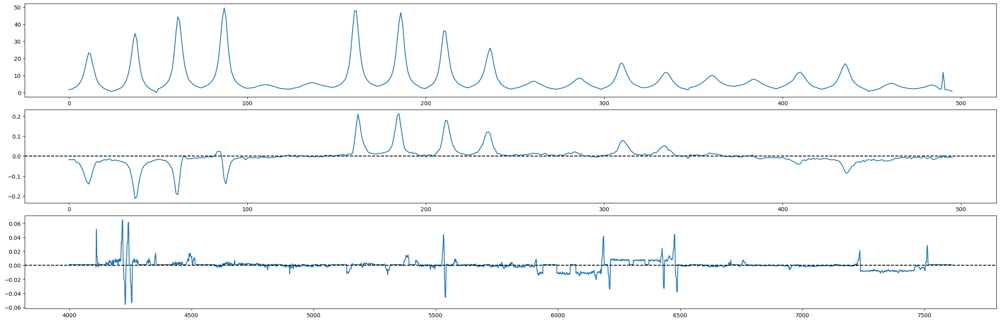

In [158]:
component = 3
data.tomography(component)

In [159]:
initial_fft_filter = 1700
initital_wavelet_filter = 5.5
initial_step_size = 5
beam = 37  # qual fibra plotar

# def restricao_param1(params):
#     # Deve ser não negativo, então retorna o valor do parâmetro.
#     # Se for negativo, a restrição não será satisfeita.
#     return params[0]


def restricao_param2(params):
    # Mesmo que acima para o segundo parâmetro.
    return params[1]


# def restricao_param3(params):
#     return params[1] - 8  # Deve ser não-positivo para satisfazer a restrição


def restricao_param4(params):
    return 1.5 - params[1]  # Deve ser não-negativo para satisfazer a restrição


constraints = [
    #    {"type": "ineq", "fun": restricao_param1},
    {"type": "ineq", "fun": restricao_param2},
    #    {"type": "ineq", "fun": restricao_param3},
    {"type": "ineq", "fun": restricao_param4},
]

stepfilter3 = data.StepSignalRemoval(component)
# step_signal3 = stepfilter3.optimize_and_remove_step_signal(initial_fft_filter, initital_wavelet_filter, initial_step_size, constraints, verbose=True, plot=True, beam=beam)

stepfilter3.calculate_and_subtract_step_signal(1726.965142774873, 3.25)
step_signal3 = stepfilter3.bad_signal
# Optimal fft: 1726.965142774873
# Optimal wavelet: 3.25

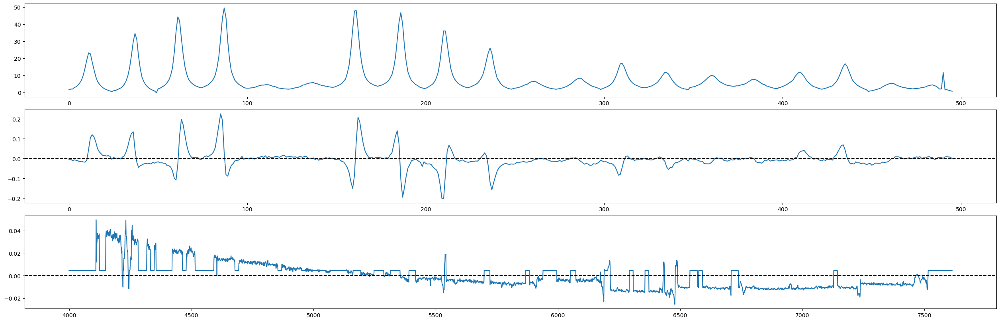

In [160]:
component = 2
data.tomography(component)

In [7]:
initial_fft_filter = 1700
initital_wavelet_filter = 20
initial_step_size = 15
beam = 37  # qual fibra plotar
stepfilter2 = data.StepSignalRemoval(component)

# def restricao_param(params):
#     return 2 - params[1]  # Deve ser não-negativo para satisfazer a restrição
# constraints = [
#     {"type": "ineq", "fun": restricao_param},

# ]

# step_signal2 = stepfilter2.optimize_and_remove_step_signal(initial_fft_filter, initital_wavelet_filter, initial_step_size, constraints, verbose=True, plot=True, beam=beam)
stepfilter2.calculate_and_subtract_step_signal(1716.404884951783, 1.5)
step_signal2 = stepfilter2.bad_signal

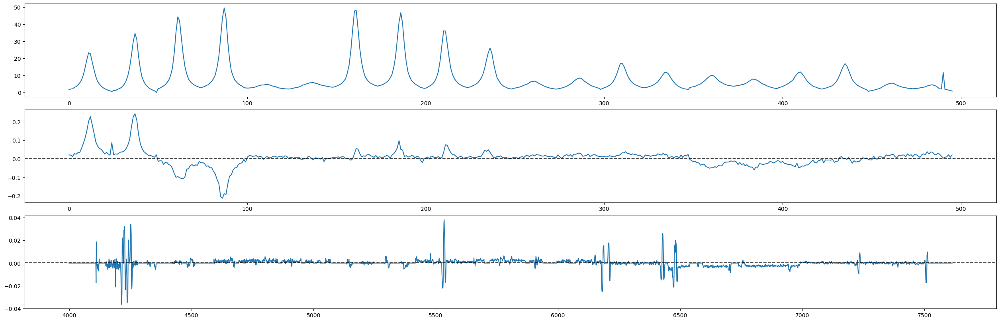

In [161]:
component = 4
data.tomography(component)

In [9]:
initial_fft_filter = 1700
initital_wavelet_filter = 20
initial_step_size = 15
beam = 37  # qual fibra plotar
stepfilter4 = data.StepSignalRemoval(component)
# step_signal4 = stepfilter4.optimize_and_remove_step_signal(initial_fft_filter, initital_wavelet_filter, initial_step_size, constraints, verbose=True, plot=True, beam=beam)

stepfilter4.calculate_and_subtract_step_signal(1703.75, 0)
step_signal4 = stepfilter4.bad_signal

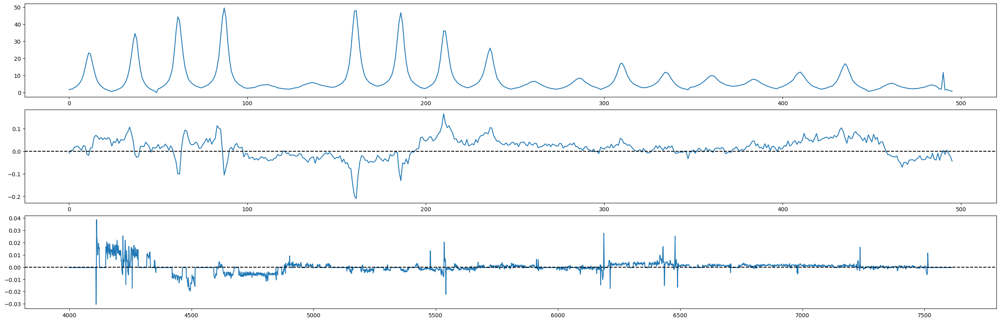

In [162]:
component = 5
data.tomography(component)

In [11]:
initial_fft_filter = 1700
initital_wavelet_filter = 20
initial_step_size = 15
beam = 37  # qual fibra plotar
stepfilter5 = data.StepSignalRemoval(component)
# step_signal5 = stepfilter5.optimize_and_remove_step_signal(initial_fft_filter, initital_wavelet_filter, initial_step_size, constraints, verbose=True, plot=True, beam=beam)
stepfilter5.calculate_and_subtract_step_signal(1703.75, 0)
step_signal5 = stepfilter5.bad_signal

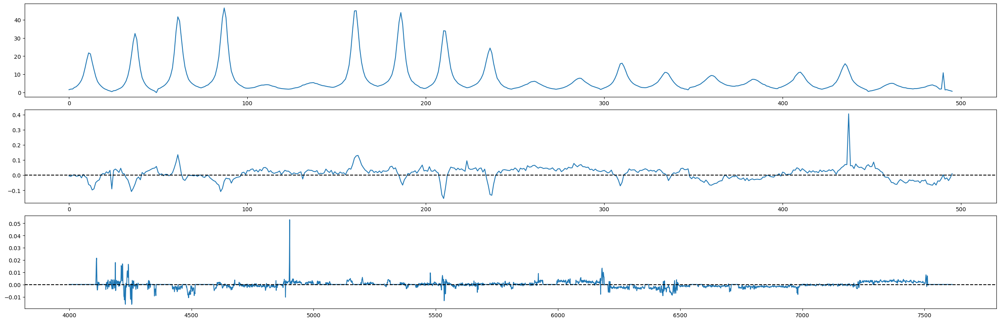

In [12]:
component = 8
data.tomography(component)

In [13]:
initial_fft_filter = 1700
initital_wavelet_filter = 20
initial_step_size = 15
beam = 37  # qual fibra plotar
stepfilter8 = data.StepSignalRemoval(component)
# step_signal8 = stepfilter8.optimize_and_remove_step_signal(initial_fft_filter, initital_wavelet_filter, initial_step_size, constraints, verbose=True, plot=True, beam=beam)
stepfilter8.calculate_and_subtract_step_signal(1694.375, 0)
step_signal8 = stepfilter8.bad_signal

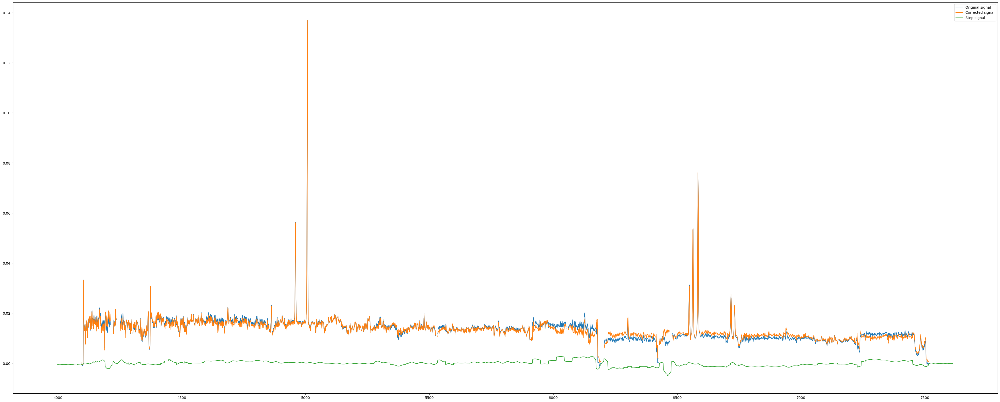

In [14]:
import matplotlib.pyplot as plt

step_total = step_signal2 + step_signal3 + step_signal4 + step_signal5 + step_signal8
step_free_source = data.noise_subtracted_source - step_total
plt.figure(figsize=(50, 20))
plt.plot(
    data.corrected_wl,  # [: len(sythetic_data)],
    data.noise_subtracted_source[beam],  # [: len(sythetic_data)],
    label="Original signal",
)
plt.plot(
    data.corrected_wl,  # [: len(sythetic_data)],
    step_free_source[beam],  # [: len(sythetic_data)],
    label="Corrected signal",
)
plt.plot(
    data.corrected_wl,  # [: len(sythetic_data)],
    step_total[beam],  # [: len(sythetic_data)],
    label="Step signal",
)
plt.legend()
plt.show()

In [29]:
combined_spectra.shape

#### Step cleaned file creation

In [164]:
from astropy import table

with fits.open(filename) as hdulist:
    sci = hdulist["SCI"].data  # Dados científicos
    mdf = table.Table(hdulist["MDF"].data)  # Metadados
beam_mask = mdf["BEAM"] == -1
source_mask = (mdf["BEAM"] == 1)[~beam_mask]
sky_mask = (mdf["BEAM"] == 0)[~beam_mask]
sky = sci[sky_mask]

In [165]:
sky_counter = 0
source_counter = 0
reconstructed_source = np.zeros(sci.shape)
for index, is_source in enumerate(source_mask):
    if is_source:
        reconstructed_source[index] = step_free_source[source_counter]
        source_counter += 1
    else:
        reconstructed_source[index] = sky[sky_counter]
        sky_counter += 1

In [167]:
name = "gsn069"
filename = f"redux/{name}_combined_spectra_ext.fits"
new_filename = f"redux/{name}_pca_combined_spectra_ext.fits"
with fits.open(filename) as hdul:
    hdul["SCI"].data = reconstructed_source
    hdul.writeto(new_filename, overwrite=True)

#### Voronoi Binning

In [2]:
from vorbin.voronoi_2d_binning import voronoi_2d_binning

name = "gsn069"
filename = f"redux/{name}_pca_combined_spectra_ext_3D.fits"
with fits.open(filename) as hdul:
    data = hdul["SCI"].data
    var = hdul["VAR"].data
    dq = hdul["DQ"].data

fits_header = fits.getheader(filename, ext=("sci", 1))
wcs = WCS(fits_header, naxis=[3])
wavelength = wcs.wcs_pix2world(np.arange(fits_header["NAXIS3"]), 0)[0]

data.shape

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


(3422, 49, 33)

In [3]:
ini_index = np.where(np.round(wavelength) == 5655)[0][0]
fin_index = np.where(np.round(wavelength) == 5745)[0][0]
sample = data[ini_index:fin_index, :, :]
sample_var = var[ini_index:fin_index, :, :]
sample_noise = np.sqrt(sample_var)

print(sample.shape)
print(sample_var.shape)

(88, 49, 33)
(88, 49, 33)


Good bins: 109
Share of good bins: 0.537


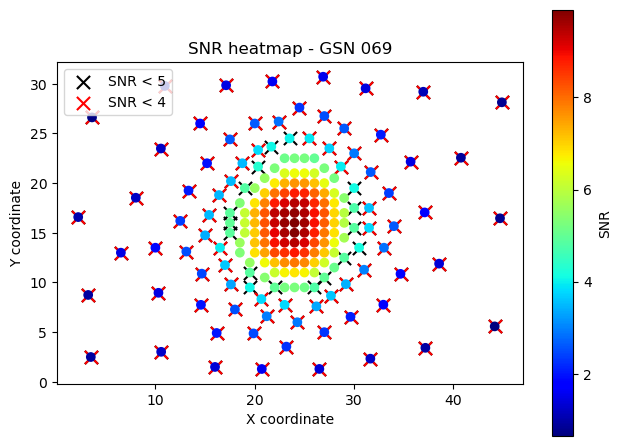

In [4]:
target_sn = 7
signal = np.nanmean(sample, axis=0)
noise = np.nanmean(sample_noise, axis=0) + 1e-10
x, y = np.indices(signal.shape)
x = x.ravel()
y = y.ravel()
bin_num, x_bin, y_bin, x_bar, y_bar, sn, n_pixels, scale = voronoi_2d_binning(
    x, y, signal.ravel(), noise.ravel(), target_sn, plot=0, quiet=1
)


threshold = 0.3
bin_ids = list(set(bin_num))
binned_data = {}
for bin_id in bin_ids:
    binned_data[bin_id] = {}
    bin_mask = bin_num == bin_id
    binx = x[bin_mask]
    biny = y[bin_mask]
    bin_mask = np.zeros(data[0, :, :].shape, dtype=bool)

    signal_sum = np.zeros(data[:, 0, 0].shape)
    var_sum = np.zeros(var[:, 0, 0].shape)

    for pixx, pixy in zip(binx, biny):
        signal_sum += data[:, pixx, pixy]
        var_sum += var[:, pixx, pixy]
        bin_mask[pixx, pixy] = True

    binned_data[bin_id]["quality_map"] = np.zeros(data.shape[0])
    for wavl in np.arange(data.shape[0]):
        wavl_dq_plane = dq[wavl, :, :]
        bad_data_ratio = np.round(
            np.sum(wavl_dq_plane[bin_mask]) / np.sum(bin_num == bin_id), 2
        )
        binned_data[bin_id]["quality_map"][wavl] = np.where(
            bad_data_ratio >= threshold, 2, 0
        ).astype(int)
    bin_signal = signal_sum / len(binx)
    bin_var = var_sum / len(binx)
    binned_data[bin_id]["signal"] = bin_signal
    binned_data[bin_id]["var"] = bin_var

true_snr = {}
for bin_id in bin_ids:
    signal = np.mean(binned_data[bin_id]["signal"][ini_index:fin_index])
    noise = np.mean(np.sqrt(binned_data[bin_id]["var"][ini_index:fin_index]))
    true_snr[bin_id] = signal / noise

all_bins = list(true_snr.keys())
x_all = np.array(x_bar)[all_bins]
y_all = np.array(y_bar)[all_bins]
snr_values = np.array(list(true_snr.values()))
good_snr_indices = [index for index, snr in enumerate(snr_values) if snr > 5]
print(f"Good bins: {len(good_snr_indices)}")
print(f"Share of good bins: {np.round(len(good_snr_indices)/len(all_bins), 3)}")
bad_snr_indices = [index for index, snr in enumerate(snr_values) if snr < 5]
really_bad_snr_indices = [index for index, snr in enumerate(snr_values) if snr < 4]

# plt.figure(figsize=(15, 10))
plt.scatter(
    x_all[bad_snr_indices],
    y_all[bad_snr_indices],
    c="black",
    marker="x",
    s=90,
    label="SNR < 5",
)
plt.scatter(
    x_all[really_bad_snr_indices],
    y_all[really_bad_snr_indices],
    c="red",
    marker="x",
    s=90,
    label="SNR < 4",
)

cmap = plt.cm.jet
sc = plt.scatter(
    x_all, y_all, c=snr_values, cmap=cmap, vmin=min(snr_values), vmax=max(snr_values)
)
plt.colorbar(sc, ax=plt.gca(), label="SNR")
plt.legend()
plt.tight_layout()
plt.gca().set_aspect("equal")
plt.title("SNR heatmap - GSN 069")
plt.xlabel("X coordinate")
plt.ylabel("Y coordinate")
plt.show()

#### Starlight pre processing

##### Pycasso resampling

In [7]:
from pycasso2.resampling import ReSamplingMatrixNonUniform


def resampling(res_lambda_min, res_lambda_max, rfwave, rfflux, rferr, qual):
    lresamp = np.arange(res_lambda_min, res_lambda_max, 1)
    matrix = ReSamplingMatrixNonUniform(rfwave, lresamp)
    fresamp = np.dot(matrix, rfflux)
    errresamp = np.dot(matrix, rferr)
    qualresamp = np.dot(matrix, qual)

    for i in range(len(qualresamp)):
        if lresamp[i] < min(rfwave):
            qualresamp[i] = 2

        elif lresamp[i] > max(rfwave):
            qualresamp[i] = 2

        if qualresamp[i] > 0:
            qualresamp[i] = 2

    return lresamp, fresamp, errresamp, qualresamp

In [28]:
lambda_min = int(np.min(wavelength))
lambda_max = int(np.max(wavelength))
res_wavelenght, res_signal, res_var, res_quality_map = resampling(
    res_lambda_min=lambda_min,
    res_lambda_max=lambda_max,
    rfwave=wavelength,
    rfflux=binned_data[0]["signal"],
    rferr=binned_data[0]["var"],
    qual=binned_data[0]["quality_map"],
)

##### Own resampling

In [31]:
# Prepare input spectrum
bin_id = 0

lambda_min = int(np.min(wavelength))
lambda_max = int(np.max(wavelength))
resampled_wavelength = np.arange(lambda_min, lambda_max, 1)

# Interpolação linear dos dados originais para o novo espaçamento de comprimentos de onda
interpolate_signal = interp1d(
    wavelength, binned_data[bin_id]["signal"], kind="linear", fill_value="extrapolate"
)
interpolate_var = interp1d(
    wavelength,
    np.sqrt(binned_data[bin_id]["var"] + 1e10),
    kind="linear",
    fill_value="extrapolate",
)

# Aplicando a interpolação para obter os novos fluxos
resampled_signal = interpolate_signal(resampled_wavelength)
resampled_var = interpolate_var(resampled_wavelength)

np.stack([resampled_wavelength, resampled_signal, resampled_var], axis=1)

array([[ 4.17000000e+03, -2.33557870e-03,  1.00000000e+05],
       [ 4.17100000e+03, -3.41014430e-03,  1.00000000e+05],
       [ 4.17200000e+03, -4.40962506e-03,  1.00000000e+05],
       ...,
       [ 7.64600000e+03,  1.79499662e-02,  1.00000000e+05],
       [ 7.64700000e+03,  1.85295525e-02,  1.00000000e+05],
       [ 7.64800000e+03,  8.01319626e-03,  1.00000000e+05]])

##### Resampling comparison

/tmp/ipykernel_52607/505559165.py:3: RuntimeWarning: invalid value encountered in divide
  plt.plot(res_wavelenght, np.clip((resampled_signal-res_signal)/res_signal, -0.5, .05))


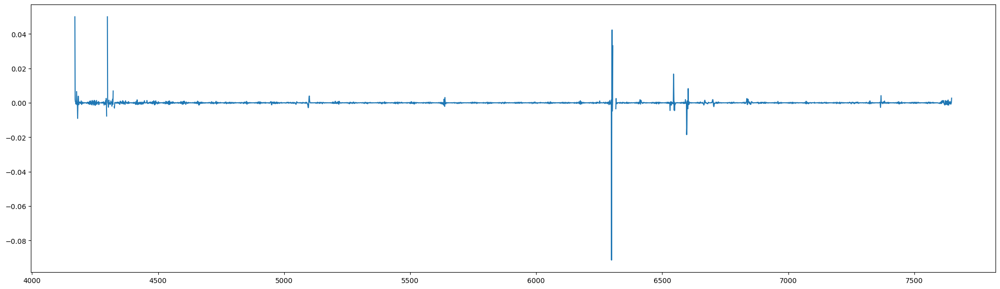

In [43]:
plt.figure(figsize=(25, 7))
# plt.plot(res_wavelenght, res_signal)
plt.plot(
    res_wavelenght, np.clip((resampled_signal - res_signal) / res_signal, -0.5, 0.05)
)

##### Proceed using pycasso

In [8]:
lambda_min = int(np.min(wavelength))
lambda_max = int(np.max(wavelength))
res_wavelenght, res_signal, res_var, res_quality_map = resampling(
    res_lambda_min=lambda_min,
    res_lambda_max=lambda_max,
    rfwave=wavelength,
    rfflux=binned_data[0]["signal"],
    rferr=binned_data[0]["var"],
    qual=binned_data[0]["quality_map"],
)

resampled_data = {}
for bin_id, bin_data in enumerate(binned_data.values()):
    res_wavelenght, res_signal, res_var, res_quality_map = resampling(
        res_lambda_min=lambda_min,
        res_lambda_max=lambda_max,
        rfwave=wavelength,
        rfflux=binned_data[bin_id]["signal"],
        rferr=binned_data[bin_id]["var"],
        qual=binned_data[bin_id]["quality_map"],
    )
    resampled_data[bin_id] = {}
    resampled_data[bin_id]["wavelength"] = res_wavelenght
    resampled_data[bin_id]["signal"] = res_signal
    resampled_data[bin_id]["var"] = res_var
    resampled_data[bin_id]["quality_map"] = res_quality_map

In [11]:
# create obs input files
for bin_id, bin_data in enumerate(resampled_data.values()):
    input_data = np.stack(
        [
            bin_data["wavelength"],
            bin_data["signal"],
            np.sqrt(bin_data["var"]),
            bin_data["quality_map"],
        ],
        axis=1,
    )
    np.savetxt(
        f"redux/starlight_synthesis/gsn069/obs_dir/{bin_id}",
        input_data,
        fmt=["%f", "%f", "%f", "%d"],
    )

/tmp/ipykernel_157720/2460282933.py:3: RuntimeWarning: invalid value encountered in sqrt
  input_data = np.stack([bin_data['wavelength'], bin_data['signal'], np.sqrt(bin_data['var']), bin_data['quality_map']], axis=1)


##### Create mask file

título

In [40]:
maskfilename = "MaskEmissionAbsortionGSN069"

with open("redux/gsn069_masks.json", "r") as f:
    masks_json = json.load(f)

window_range = 8
masks_json["emission_centers"] = np.round(masks_json["emission_centers"])
masks_json["emission_windows"] = [
    [emiss_center - window_range, emiss_center + window_range]
    for emiss_center in masks_json["emission_centers"]
]


all_masks = masks_json["emission_windows"]
all_masks.extend(masks_json["absortion_windows"])
nmasks = len(all_masks)

with open(f"redux/starlight_synthesis/{maskfilename}", "w") as file:
    file.write(str(nmasks) + "\n")
    for window in all_masks:
        file.write(f"{window[0]} {window[1]} 0 \n")

#### Mask exploration

In [3]:
def inspect_velocity_redshift_emission(
    source,
    wl,
    mdf,
    emission_lines: list,
    # absortion_windows:list,
    beams: list,
    delta,
):

    nbeamplots = len(beams)  # number of beams to plot
    nplots = (
        nbeamplots + 1
    )  # total number of plots is the number of beams selected + 1 (the first plot is the sum of all beams)
    plot_heigth = nplots * 5
    fig, ax = plt.subplots(
        nrows=nplots, ncols=1, figsize=(60, plot_heigth), sharex=True
    )
    ax[0].plot(wl, np.nansum(source, axis=0))
    ax[0].set_title("Sum of all spectra")

    # Make a lookup table from the MDF to know which row in the matrix represent each beam
    pdmdf = mdf.to_pandas()
    source_mdf = pdmdf[(pdmdf["BEAM"] == 1)].reset_index(drop=True)
    target_beams_mdf = source_mdf[(source_mdf["NO"].isin(beams))].reset_index()
    for beam_seq, beam_id in enumerate(beams):
        beam_row = target_beams_mdf[target_beams_mdf["NO"] == beam_id]["index"].item()
        plot_index = beam_seq + 1
        ax[plot_index].plot(wl, source[beam_row])
        ax[plot_index].set_title(f"Signal of beam {beam_id}")

    for wl in emission_lines:
        for figure in ax:
            figure.axvline(wl - delta, ls="dashed", color="red", lw=0.6)
            figure.axvline(wl + delta, ls="dashed", color="orange", lw=0.6)

    """ for abs_window in absortion_windows:
        for figure in ax:
            figure.axvline(abs_window[0], ls='dashed', color='black', lw=.6)
            figure.axvline(abs_window[1], ls='dashed', color='gray', lw=.6) """

    plt.show()

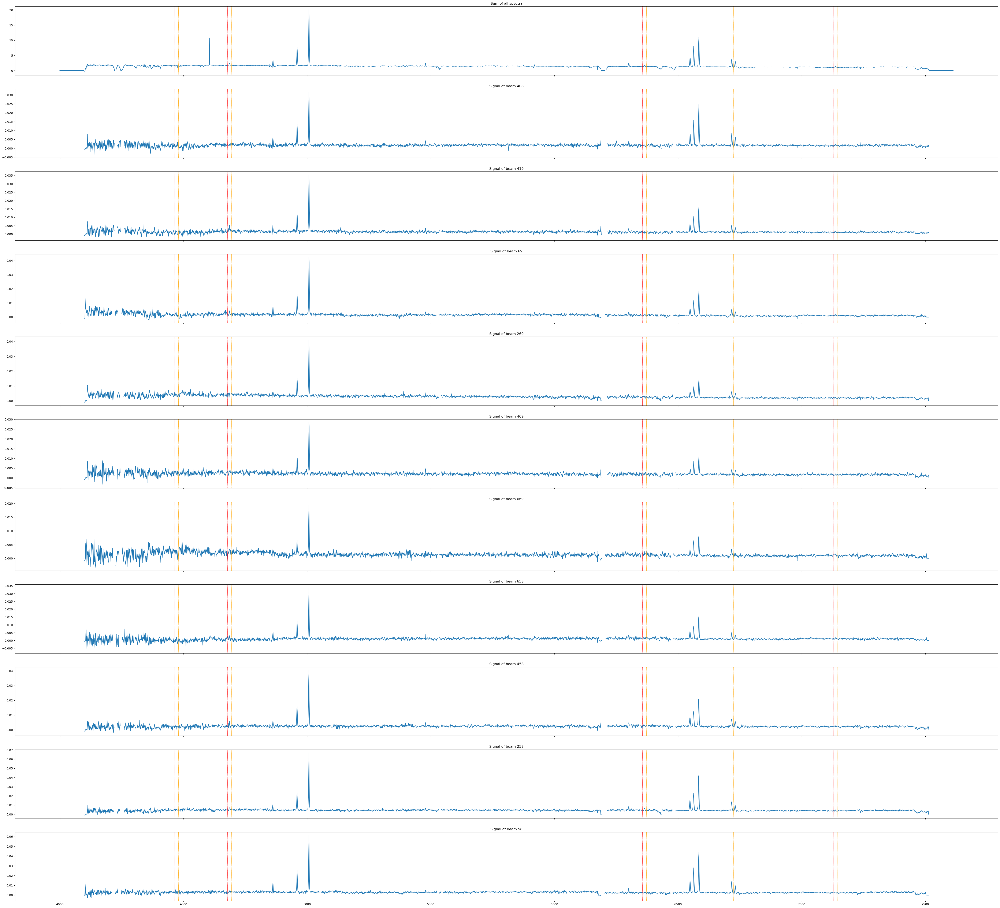

In [4]:
emission_lines = [
    4101.73,  # Hδ
    4340.46,  # Hγ
    4363.21,  # [O III]
    4471.5,  # He I
    4685.68,  # He II
    4861.33,  # Hβ
    4958.91,  # [O III]
    5006.84,  # [O III]
    5875.6,  # He I
    6300.30,  # [O I]
    6363.78,  # [O I]
    6548.05,  # [N II]
    6562.79,  # Hα
    6583.45,  # [N II]
    6716.44,  # [S II]
    6730.82,  # [S II]
    7135.8,  # [Ar III]
]

delta = 8
beams = [408, 419, 69, 269, 469, 669, 658, 458, 258, 58]
inspect_velocity_redshift_emission(
    source, corrected_wl, mdf, emission_lines, beams, delta
)

In [7]:
import os


def extract_age_from_file(file_path):
    """Extract the age from the given file."""
    with open(file_path, "r") as file:
        lines = file.readlines()
        for line in lines:
            if line.strip().startswith("# Age (yr)"):
                # Extract the age value
                age = line.split()[3]
                return float(age)
    return None


def process_files_in_folder(folder_path):
    """Process all files in the given folder and return a dictionary with file names and ages."""
    age_dict = {}
    for file_name in os.listdir(folder_path):
        file_path = os.path.join(folder_path, file_name)
        if os.path.isfile(file_path):
            age = extract_age_from_file(file_path)
            if age is not None:
                age_dict[file_name] = age
    return age_dict


folder_path = "STARLIGHTv04/BasesDir"
ages_dictionary = process_files_in_folder(folder_path)
target_bases = {
    key: value for key, value in ages_dictionary.items() if 2e9 <= value <= 5e9
}
target_bases


def read_target_flux(filename, lambdamin, lambdamax):
    file_path = f"{folder_path}/{filename}"
    base = pd.read_csv(
        file_path, delim_whitespace=True, skiprows=6, names=["lambda", "flux"]
    )
    base = base[(base["lambda"] >= lambdamin) & (base["lambda"] <= lambdamax)]
    return base


def inspect_absortion_ref(
    files,
    lambdamin,
    lambdamax,
    absortion_windows: list,
):

    nplots = len(files)  # number of beams to plot
    plot_heigth = nplots * 5
    fig, ax = plt.subplots(
        nrows=nplots, ncols=1, figsize=(60, plot_heigth), sharex=True
    )

    for index, filename in enumerate(files):

        base = read_target_flux(filename, lambdamin, lambdamax)
        ax[index].plot(base["lambda"], base["flux"])
        ax[index].set_title(f"Signal of {filename}")

    for abs_window in absortion_windows:
        for figure in ax:
            figure.axvline(abs_window[0], ls="dashed", color="black", lw=0.6)
            figure.axvline(abs_window[1], ls="dashed", color="gray", lw=0.6)

    plt.show()

In [ ]:
def inspect_velocity_redshift_absortion(
        masked_source, 
        wl, 
        mdf, 
        absortion_windows, 
        #observed_absortion_windows,
        beams,
        *args,
        **kwargs
    ):
    
    nbeamplots = len(beams) # number of beams to plot
    nplots = nbeamplots + 1 # total number of plots is the number of beams selected + 1 (the first plot is the sum of all beams)
    plot_heigth = nplots * 5
    fig, ax = plt.subplots(nrows=nplots, ncols=1, figsize=(60,plot_heigth), sharex=True)
    ax[0].plot(wl, np.clip(np.nansum(masked_source, axis=0), -1000, 2.5))
    ax[0].set_title("Sum of all spectra")


    for beam_seq, beam_id in enumerate(beams):
        beam_row = target_beams_mdf[target_beams_mdf['NO']==beam_id]['index'].item()
        plot_index = beam_seq + 1
        
        ax[plot_index].plot(wl, masked_source[beam_row])
        ax[plot_index].set_title(f'Signal of beam {beam_id}')

    for abs_window in absortion_windows:
        for figure in ax:
            figure.axvline(abs_window[0], ls='dashed', color='black', lw=.6)
            figure.axvline(abs_window[1], ls='dashed', color='gray', lw=.6)
    
    if kwargs.get('observed_absortion_windows'):
        for abs_window in observed_absortion_windows:
            for figure in ax:
                figure.axvline(abs_window[0], ls='dashed', color='red', lw=.6)
                figure.axvline(abs_window[1], ls='dashed', color='yellow', lw=.6)
        
    plt.show()

    inspect_velocity_redshift_absortion(data[], corrected_wl, mdf, observed_absortion_windows, beams)

In [6]:
data[:, 24, 24]

array([-0.00048262, -0.00162791, -0.00219381, ..., -0.000678  ,
       -0.00071111, -0.00048298], dtype='>f4')

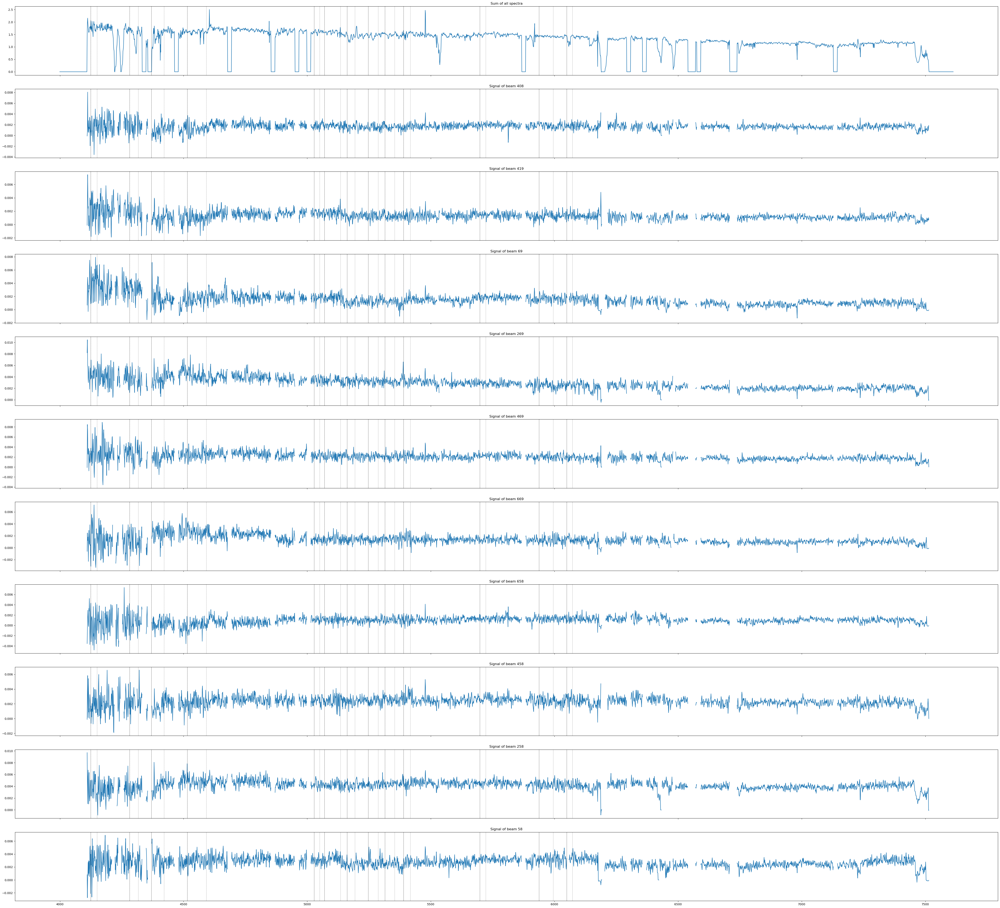

In [8]:
def inspect_velocity_redshift_absortion(
    masked_source,
    wl,
    mdf,
    absortion_windows,
    # observed_absortion_windows,
    beams,
    *args,
    **kwargs,
):

    nbeamplots = len(beams)  # number of beams to plot
    nplots = (
        nbeamplots + 1
    )  # total number of plots is the number of beams selected + 1 (the first plot is the sum of all beams)
    plot_heigth = nplots * 5
    fig, ax = plt.subplots(
        nrows=nplots, ncols=1, figsize=(60, plot_heigth), sharex=True
    )
    ax[0].plot(wl, np.clip(np.nansum(masked_source, axis=0), -1000, 2.5))
    ax[0].set_title("Sum of all spectra")

    # Make a lookup table from the MDF to know which row in the matrix represent each beam
    pdmdf = mdf.to_pandas()
    source_mdf = pdmdf[(pdmdf["BEAM"] == 1)].reset_index(drop=True)
    target_beams_mdf = source_mdf[(source_mdf["NO"].isin(beams))].reset_index()
    for beam_seq, beam_id in enumerate(beams):
        beam_row = target_beams_mdf[target_beams_mdf["NO"] == beam_id]["index"].item()
        plot_index = beam_seq + 1

        ax[plot_index].plot(wl, masked_source[beam_row])
        ax[plot_index].set_title(f"Signal of beam {beam_id}")

    for abs_window in absortion_windows:
        for figure in ax:
            figure.axvline(abs_window[0], ls="dashed", color="black", lw=0.6)
            figure.axvline(abs_window[1], ls="dashed", color="gray", lw=0.6)

    if kwargs.get("observed_absortion_windows"):
        for abs_window in observed_absortion_windows:
            for figure in ax:
                figure.axvline(abs_window[0], ls="dashed", color="red", lw=0.6)
                figure.axvline(abs_window[1], ls="dashed", color="yellow", lw=0.6)

    plt.show()


absortion_windows = [
    (4082, 4124),
    # (4124, 4150),
    (4244, 4284),
    # (4284, 4318),
    (4318, 4364),
    (4420, 4450),
    (4846, 4884),
    (5156, 5196),
    # (5156, 5196),
    (5880, 5914),
    (6036, 6088),
    (6858, 6934),
    (6934, 7050),
    (7050, 7158),
    (7158, 7274),
]


observed_absortion_windows = [
    (4124, 4150),
    (4282, 4317),
    (4370, 4421),
    (4515, 4592),
    (5028, 5050),
    (5070, 5135),
    (5161, 5193),
    (5247, 5287),
    (5314, 5354),
    (5390, 5417),
    (5698, 5722),
    (5938, 5995),
    (6050, 6073),
    # (6138, 6166),
]

lick = [
    # (4282, 4317),
    # (4370, 4421),
    # (4453, 4475),
    # (4515, 4560),
    # (4635, 4721), # ???
    # (4979, 5055), # ???
    # (5070, 5135),
    # (5155, 5197),
    # (5161, 5193),
    # (5247, 5287),
    # (5314, 5354),
    # (5390, 5417),
    # (5698, 5722),
    # (5778, 5798),
    # (5878, 5911), #???
    # (5938, 5995),
    # (6191, 6273),
]

inspect_velocity_redshift_absortion(
    emission_masked_source, corrected_wl, mdf, observed_absortion_windows, beams
)

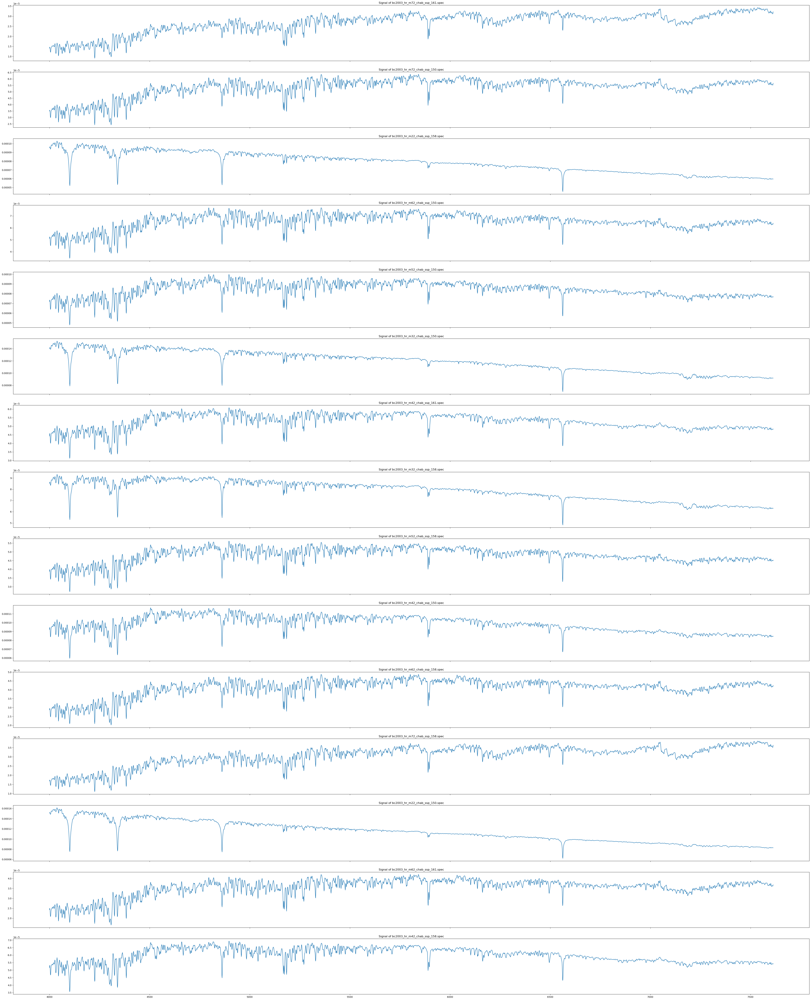

In [9]:
target_bases_filenames = list(target_bases.keys())
lambdamin = corrected_wl.min()
lambdamax = corrected_wl.max()

inspect_absortion_ref(target_bases_filenames, lambdamin, lambdamax, lick)

#### Beam map

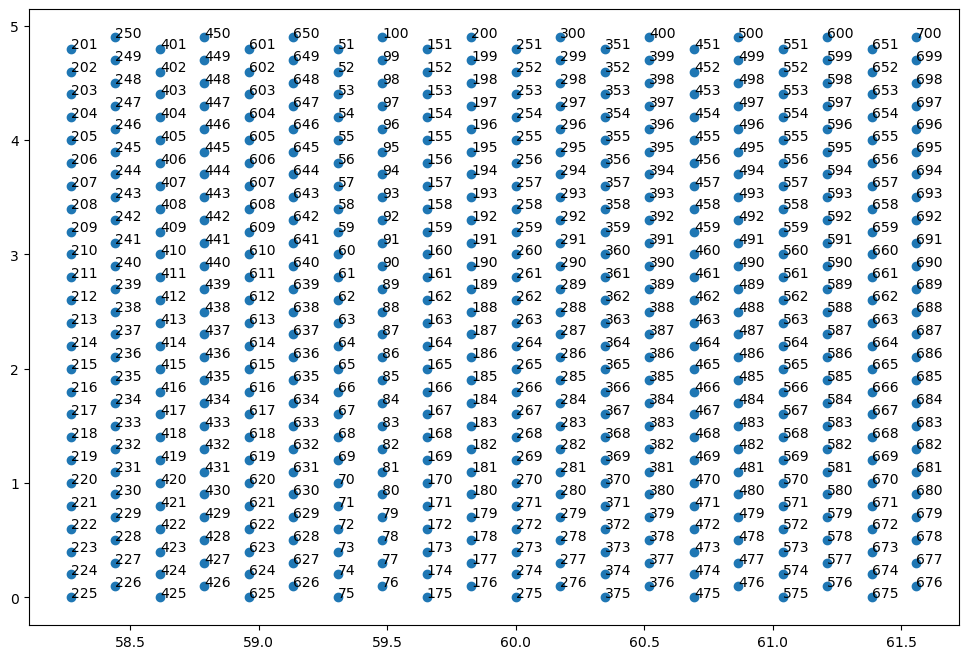

In [239]:
mdf_sky = tomo.mdf[tomo.mdf["XINST"] > 10]

fig, ax = plt.subplots(figsize=(12, 8))
ax.scatter(mdf_sky["XINST"], mdf_sky["YINST"])

for row in mdf_sky:
    ax.annotate(str(row["NO"]), (row["XINST"], row["YINST"]))

plt.show()